UID: 118739472 (Macy Donahoe)

UID: 118776026 (Danny Pham)

UID: 120092572 (Andrew Wang)

# **CMSC426 Project 2: Panorama Stitching**

---



# Introduction

The aim of this project is to implement an end-to-end pipeline for panorama stitching. We all use the panorama mode on our smart-phones– you’ll implement a pipeline which does the same basic thing!

This document just provides an overview of what you need to do. For a full breakdown of how each step in the pipeline works, see the [course notes](https://cmsc426.github.io/pano/) for this project.

# System Overview
Here’s a system diagram, showing each step in your panorama-stitching pipeline:
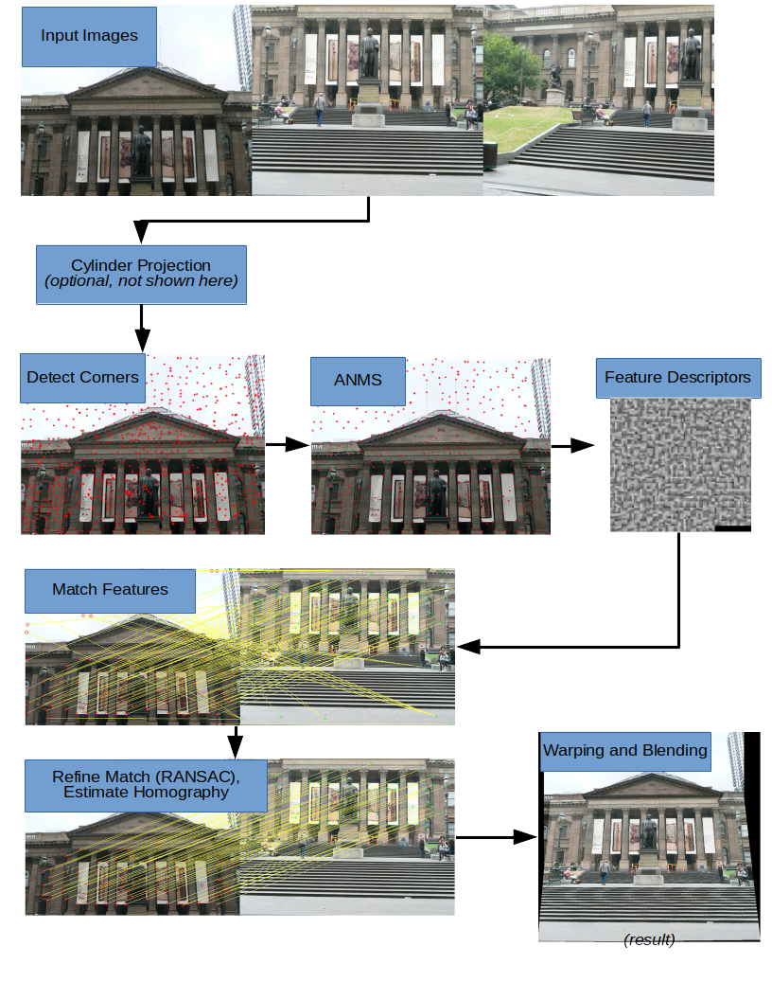







In [47]:
# Download training images from Google Drive
# import gdown
# gdown.download_folder(id="1VAB_BG2gntlkwR059zR_8gd9pXajzgIk", quiet=True, use_cookies=False)

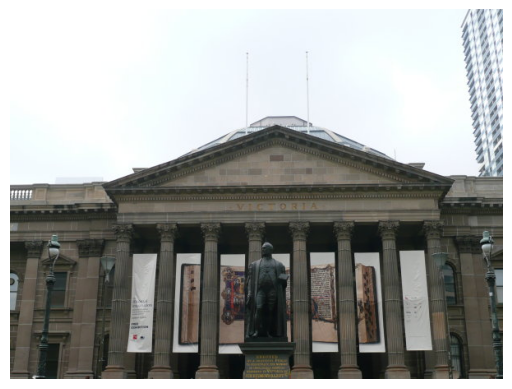

In [1]:
# Check whether the training images were successfully imported
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

train_image = mpimg.imread('./content/train_images/Set1/1.jpg')
plt.imshow(train_image)
plt.axis("off")
plt.show()

## Problem Statement

### 1. Detect Corners and Adaptive Non-Maximal Suppression (or ANMS) [25 points]


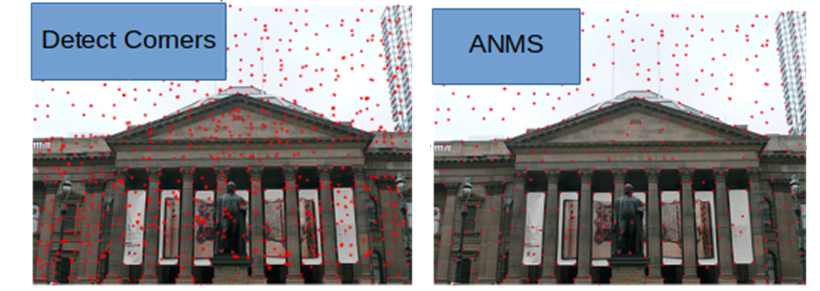

#### Step 1: Corner Detection

The first step in stitching a panorama is extracting corners like most computer vision tasks. Here we will use either Harris corners or Shi-Tomasi corners. Use **cv2.cornerHarris** or **cv2.goodFeaturesToTrack** to implement this part.


In [2]:
# Created a function to grayscale an image without using cv2.cvtColor
def grayscale_img(img):
    # standard rgb to grayscale conversion
    gray = 0.299 * img[:,:,0] + 0.587 * img[:,:,1] + 0.114 * img[:,:,2]

    # convert to float to use for processing
    return gray.astype(np.float32)

In [5]:
### Corner Detection
# 1) Convert image to gray scale image
# 2) Run harris or other corner detection from cv2 (cv2.cornerHarris OR cv2.goodFeaturesToTrack, etc.)
# Show the corner detection results for one image!!!
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_corner(img):
  # 1) Convert image to gray scale image
  gray = grayscale_img(img)

  # # Displays grey scaled image
  # plt.imshow(gray, cmap="gray")
  # plt.axis("off")
  # plt.show()

  # 2) Applying Harris corner detection
  harris = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

  # had to make a copy of the image since original is "read-only"
  # ValueError: assignment destination is read-only
  img_copy = img.copy()

  # Sets corner detection color as red on image copy
  img_copy[harris > 0.01 * harris.max()] = [255, 0, 0]

  plt.imshow(img_copy)
  plt.axis('off')
  plt.show()

  return None

In [74]:
import os

training_images = []
training_images_name = []

for image in os.listdir("./content/train_images/Set1"):
    file = "./content/train_images/Set1/"+image
    training_images.append(mpimg.imread(file))
    training_images_name.append(file)

for image in os.listdir("./content/train_images/Set2"):
    file = "./content/train_images/Set2/"+image
    training_images.append(mpimg.imread(file))
    training_images_name.append(file)

for image in os.listdir("./content/train_images/Set3"):
    file = "./content/train_images/Set3/"+image
    training_images.append(mpimg.imread(file))
    training_images_name.append(file)

./content/train_images/Set1/2.jpg


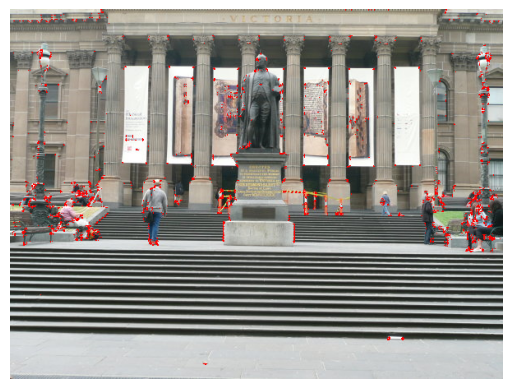

./content/train_images/Set1/3.jpg


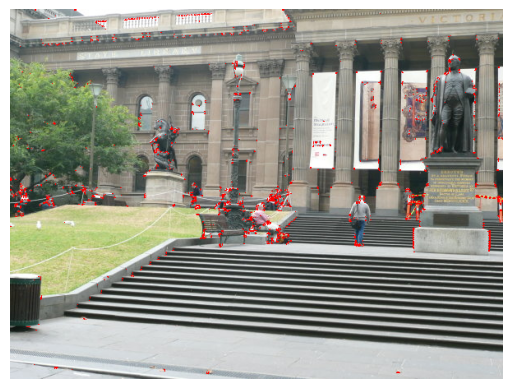

./content/train_images/Set1/1.jpg


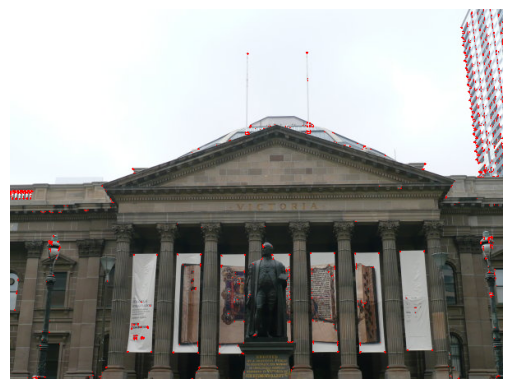

./content/train_images/Set2/2.jpg


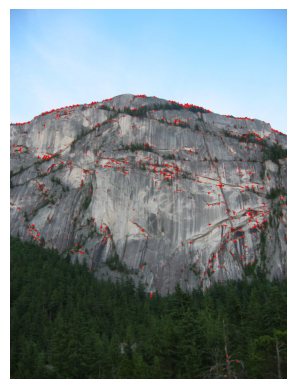

./content/train_images/Set2/3.jpg


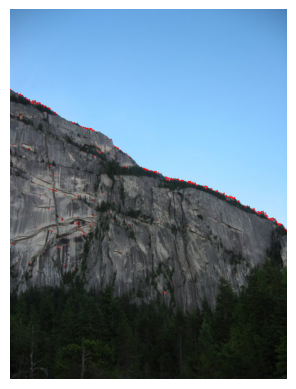

./content/train_images/Set2/1.jpg


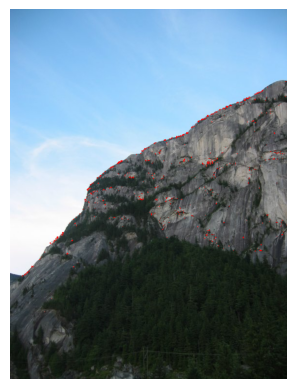

./content/train_images/Set3/8.jpg


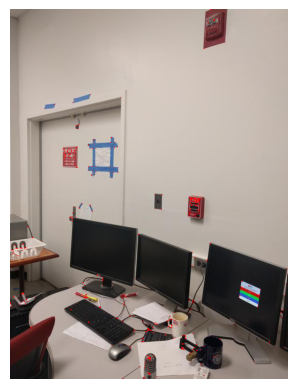

./content/train_images/Set3/4.jpg


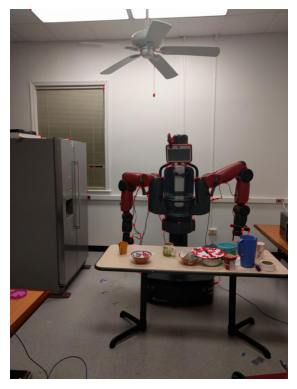

./content/train_images/Set3/5.jpg


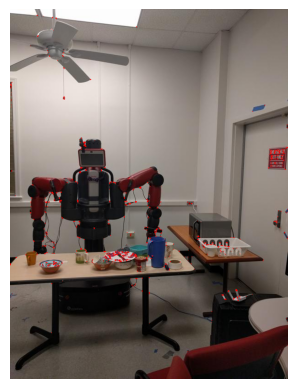

./content/train_images/Set3/7.jpg


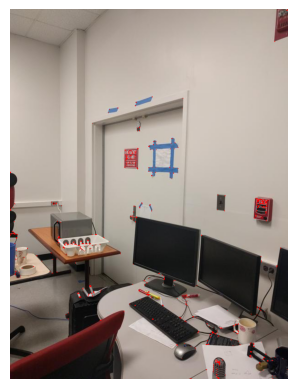

./content/train_images/Set3/6.jpg


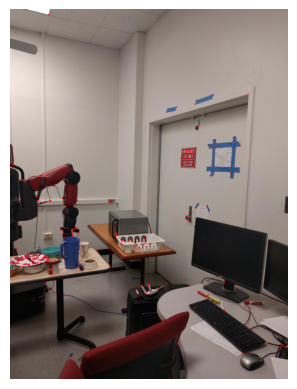

./content/train_images/Set3/2.jpg


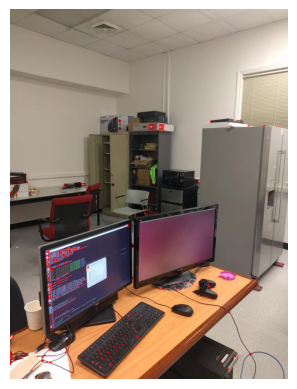

./content/train_images/Set3/3.jpg


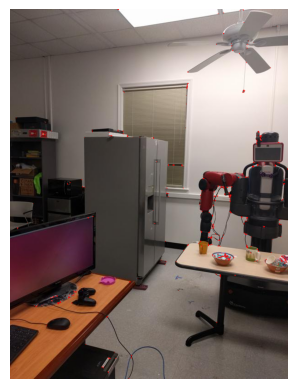

./content/train_images/Set3/1.jpg


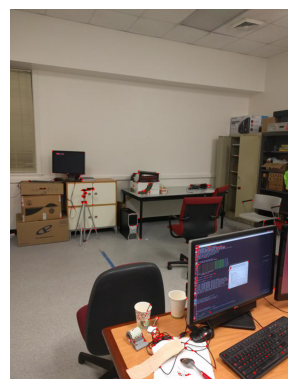

In [77]:
# Show you result here
for i, img in enumerate(training_images):
    print(training_images_name[i])
    detect_corner(img)

#### Step 2: Adaptive Non-Maximal Suppression (or ANMS)

The objective of this step is to detect corners such that they are equally distributed across the image in order to avoid weird artifacts in warping.

In a real image, a corner is never perfectly sharp, each corner might get a lot of hits out of the **N**
 strong corners - we want to choose only the **$N_{best}$**
 best corners after ANMS. In essence, you will get a lot more corners than you should! ANMS will try to find corners which are true local maxima. The algorithm for implementing ANMS is given below.



In [23]:
### Adaptive Non-Maximal Suppression (or ANMS)
# Perform ANMS: Adaptive Non-Maximal Suppression
# Show ANMS output as an image

def ANMS(cmap, corners, num_best):
  N_strong = len(corners)

  # initializes all values of r as inf
  r = np.full(N_strong, np.inf)

  # nested for loop i,j iterating through corners performing ANMS algo
  for i in range(1, N_strong):
    xi = corners[i][0]
    yi = corners[i][1]
    c_img_i = cmap[yi][xi]

    for j in range (1, N_strong):
      xj = corners[j][0]
      yj = corners[j][1]
      c_img_j = cmap[yj][xj]

      ED = 0
      if c_img_j > c_img_i:
        ED = (xj - xi)**2 + (yj- yi)**2

      if ED < r[i]:
        r[i] = ED

  # Sort r in descending order and pick top N_best points
  sorted_r = np.argsort(r)[::-1] # descending
  top_num_best_points = []

  # Pick top n_best points
  for i in sorted_r[:num_best]:
    top_num_best_points.append(corners[i])

  return top_num_best_points

./content/train_images/Set1/2.jpg


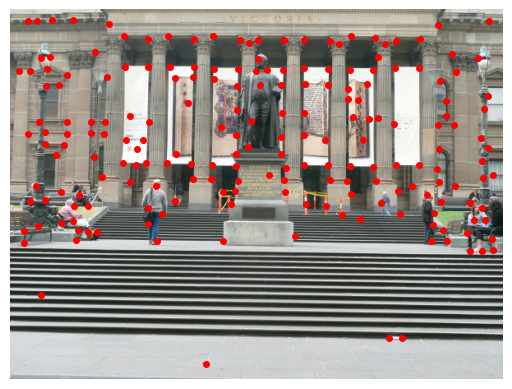

./content/train_images/Set1/3.jpg


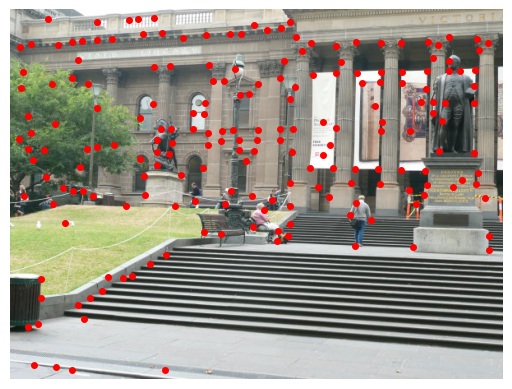

./content/train_images/Set1/1.jpg


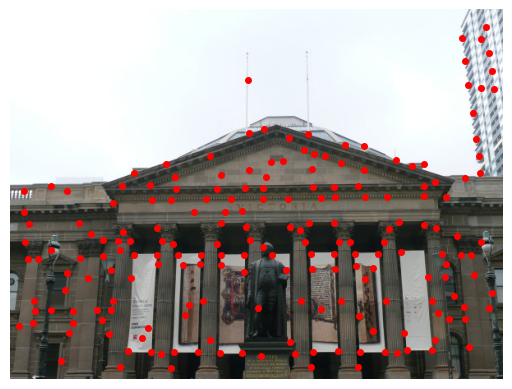

./content/train_images/Set2/2.jpg


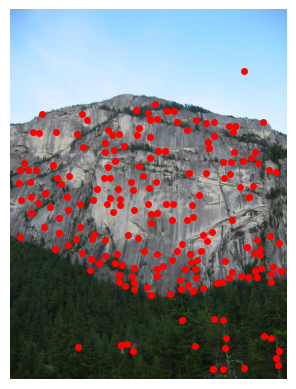

./content/train_images/Set2/3.jpg


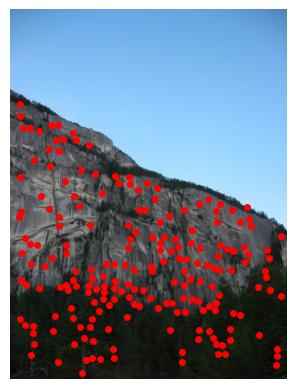

./content/train_images/Set2/1.jpg


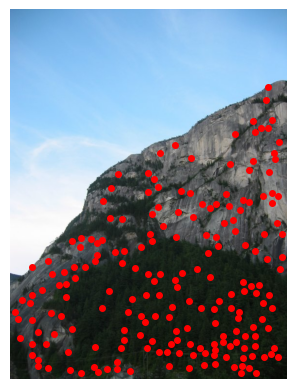

./content/train_images/Set3/8.jpg


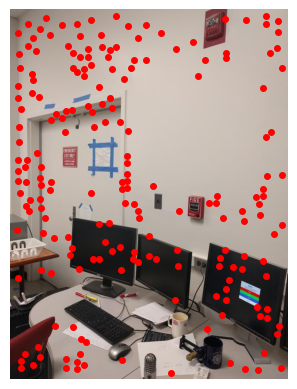

./content/train_images/Set3/4.jpg


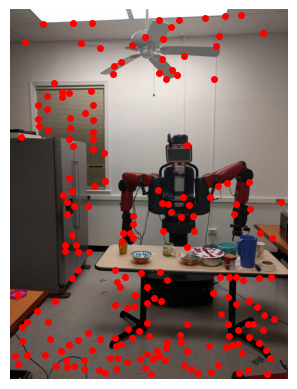

./content/train_images/Set3/5.jpg


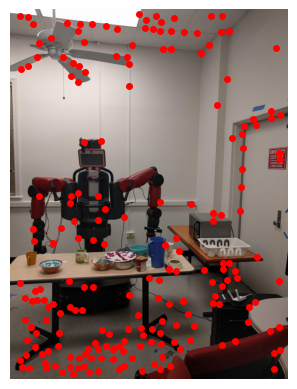

./content/train_images/Set3/7.jpg


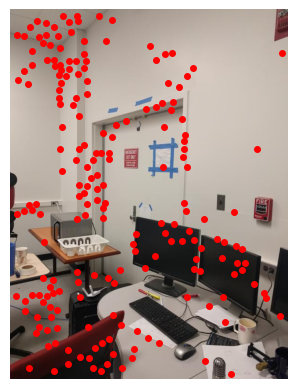

./content/train_images/Set3/6.jpg


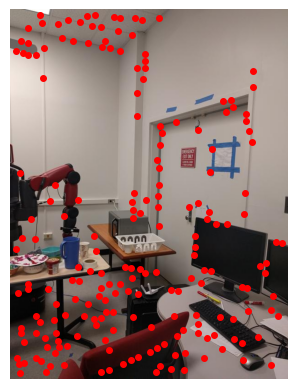

./content/train_images/Set3/2.jpg


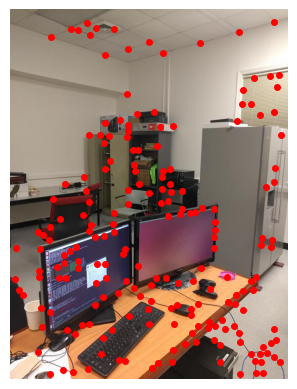

./content/train_images/Set3/3.jpg


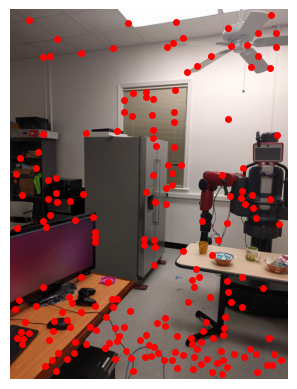

./content/train_images/Set3/1.jpg


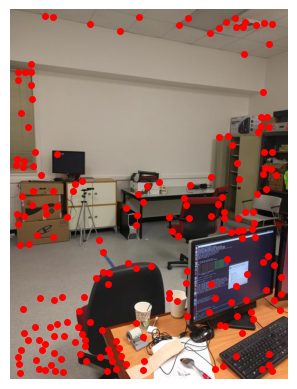

In [78]:
# Show you result here
import cv2
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import skimage
import os

for i, img in enumerate(training_images):
    # Img to gray scale
    gray = grayscale_img(img)

    # # Displays grey scaled image
    # plt.imshow(gray, cmap="gray")
    # plt.axis("off")
    # plt.show()

    # Use Harris corner detection to get cmap
    cmap = cv2.cornerHarris(gray, blockSize=2, ksize=3, k=0.04)

    # Get local maxima 
    corners = skimage.feature.peak_local_max(cmap, min_distance=10)
    corners_swapped = []

    for y, x in corners:
        corners_swapped.append(np.array([x, y]))

    corners = np.array(corners_swapped) 

    print(training_images_name[i])

    # Can fine tune num_best
    top_num_best_points = ANMS(cmap, corners, num_best=200)

    plt.imshow(img, cmap='gray')

    # Plotting top_num_best_points from ANMS algo
    for x, y in top_num_best_points:
        plt.plot(x, y, 'ro', markersize=4)

    plt.axis('off')
    plt.show()

### 2. Feature Descriptors: [15pts]

In the previous step, you found the feature points (locations of the Nbest
 best corners after ANMS are called the feature point locations). You need to describe each feature point by a feature vector, this is like encoding the information at each feature point by a vector. One of the easiest feature descriptor is described next.

Take a patch of **size 40×40**
 centered **(this is very important**) around the keypoint/feature point. Now apply gaussian blur (feel free to play around with the parameters, for a start you can use OpenCV’s default parameters in **cv2.GaussianBlur** command. Now, sub-sample the blurred output (this reduces the dimension) to 8×8
. Then reshape to obtain a 64×1
 vector. Standardize the vector to have zero mean and variance of 1. Standardization is used to remove bias and to achieve some amount of illumination invariance.

In [85]:
# Show you result here
import cv2
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

### Generate feature Descriptor for corners
def feature_descript(gray_img, corners):
  patch_list = []
  patch = np.zeros(40)
  
  # take 40x40 centered from each point in top_num_best_points
  for feature_point in corners:
    x, y = feature_point
    
    # x - half of patch dimension (40) so 20
    top_left_x = max(x - 20, 0)
    top_left_y = max(y - 20, 0)

    bottom_right_x = min(top_left_x + 40, gray_img.shape[1])
    bottom_right_y = min(top_left_y + 40, gray_img.shape[0])

    # creating patch
    patch = gray_img[top_left_y:bottom_right_y, top_left_x:bottom_right_x].copy()
    
    # print(patch.shape)
    
    if patch.size != 0 and patch.shape[0] == 40 and patch.shape[1] == 40:    
      # apply gaussian blur to patch with default parameters (can change later if needed)
      blurred_patch = cv2.GaussianBlur(patch, (5,5), 0)

      # plt.imshow(blurred_patch, cmap='gray')
      # plt.show()
      
      # take subsample 8x8 and reshape to 64x1 vector
      # take every 5th pixel, 40/8 = 5
      subsample = blurred_patch[::5, ::5]

      # print (subsample.shape)
      # plt.imshow(subsample, cmap='gray')

      # reshape subsample to 64x1
      reshaped_subsample = subsample.reshape(64,1)
      
      # print(reshaped_subsample.shape)
      
      # subtract all values by the mean (np.mean of vector) then divide by standard deviation 
      # to standarize vector to have mean 0, variance 1
      mean = np.mean(reshaped_subsample)
      sd = np.std(reshaped_subsample)
      
      reshaped_subsample = (reshaped_subsample - mean) / (sd + (1e-8)) # + 1e-8 for DivideByZero warning
      patch_list.append(reshaped_subsample) # appends to patch_list
    
  # graph each standarized patch.
  num_patches = len(patch_list)

  _, axes = plt.subplots(1, num_patches, figsize=(num_patches, 1), dpi=100)

  for i, patch in enumerate(patch_list):
      axes[i].imshow(patch.reshape(8, 8), cmap='gray')
      axes[i].axis('off')

  plt.tight_layout()
  plt.show()
  
  return corners, patch_list

./content/train_images/Set1/2.jpg


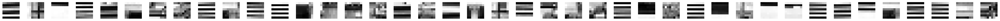

./content/train_images/Set1/3.jpg


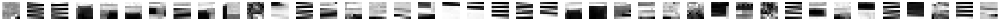

./content/train_images/Set1/1.jpg


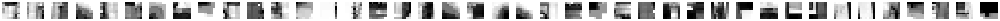

./content/train_images/Set2/2.jpg


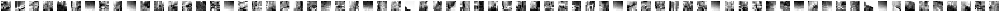

./content/train_images/Set2/3.jpg


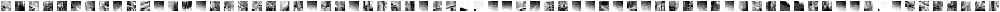

./content/train_images/Set2/1.jpg


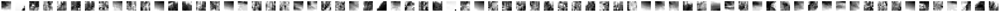

./content/train_images/Set3/8.jpg


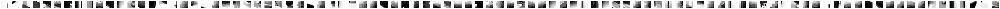

./content/train_images/Set3/4.jpg


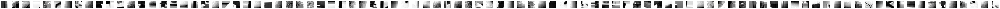

./content/train_images/Set3/5.jpg


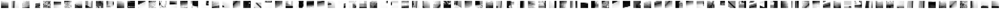

./content/train_images/Set3/7.jpg


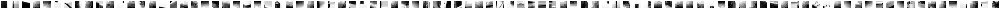

./content/train_images/Set3/6.jpg


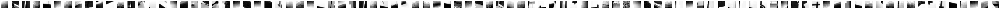

./content/train_images/Set3/2.jpg


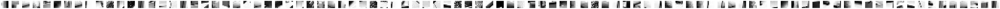

./content/train_images/Set3/3.jpg


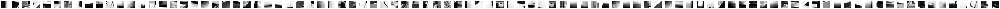

./content/train_images/Set3/1.jpg


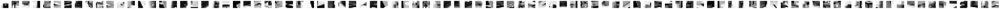

In [88]:
# Show you result here
for i, img in enumerate(training_images):
    # Img to gray scale
    gray = grayscale_img(img)

    # obtain top_num best points
    top_num_best_points = ANMS(cmap, corners, num_best=100)
    
    print(training_images_name[i])
    
    corners, patch_list = feature_descript(gray, top_num_best_points)

### 3. Feature Matching: [15pts]

In the previous step, you encoded each keypoint by **64×1**
 feature vector. Now, you want to match the feature points among the two images you want to stitch together. In computer vision terms, this step is called as finding feature correspondences between the 2 images. Pick a point in image 1, compute sum of square differences between all points in image 2. Take the ratio of best match (lowest distance) to the second best match (second lowest distance) and if this is below some ratio keep the matched pair or reject it. Repeat this for all points in image 1. You will be left with only the confident feature correspondences and these points will be used to estimate the transformation between the 2 images, also called as Homography. Use the function **cv2.drawMatches** to visualize feature correspondences. Below is an image showing matched features.



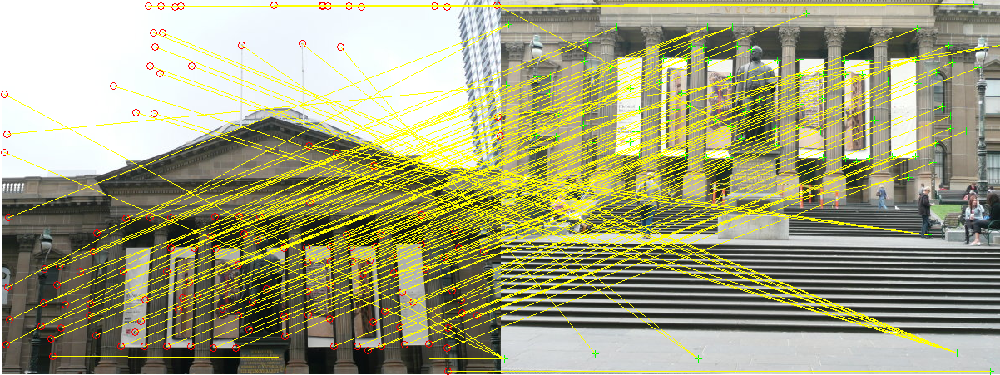

In [56]:
### Feature matching

# corner1, corner2 is 232x64 (feature x feature descriptors)
def feature_match(img1, img2, corner1, corner2, patch_list1, patch_list2):
  # TODO finetune threshold
  threshold = 0.8
  matches = []

  for i in range(len(patch_list1)):
    sse = np.square(patch_list2 - patch_list1[i]).sum(axis=1).flatten()

    # Identify best two matches
    indices = np.argsort(sse) # Default is asc order
    best, best_second = sse[indices[0]], sse[indices[1]]

    # Compare against threshold
    if (best_second / best) > threshold:
      # Have to convert to cv2 datatype to draw plot
      match = cv2.DMatch(_queryIdx=i, _trainIdx=int(indices[0]), _distance=float(best))
      matches.append(match)

  # Use cv2.drawMatches to display correspondences
  kp1 = [cv2.KeyPoint(x=float(pt[0]), y=float(pt[1]), size=10) for pt in corner1]
  kp2 = [cv2.KeyPoint(x=float(pt[0]), y=float(pt[1]), size=10) for pt in corner2]

  img_matches = cv2.drawMatches(
    img1, kp1,
    img2, kp2,
    matches,
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
  )
  plt.imshow(img_matches)
  return kp1, kp2, matches

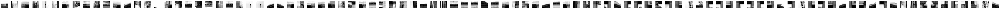

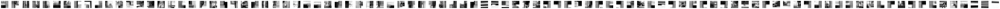

In [89]:
# Testing step 3 for functionality
img1 = mpimg.imread('./content/train_images/Set1/1.jpg')
img2 = mpimg.imread('./content/train_images/Set1/2.jpg')

# Img to gray scale
gray1, gray2 = grayscale_img(img1), grayscale_img(img2)

cmap1, cmap2 = cv2.cornerHarris(gray1, blockSize=2, ksize=3, k=0.04), cv2.cornerHarris(gray2, blockSize=2, ksize=3, k=0.04) 

corners1 = skimage.feature.peak_local_max(cmap1, min_distance=15)
corners_swapped = []

for y, x in corners1:
    corners_swapped.append(np.array([x, y]))

corners1 = np.array(corners_swapped) 


corners2 = skimage.feature.peak_local_max(cmap2, min_distance=15)
corners_swapped = []

for y, x in corners2:
    corners_swapped.append(np.array([x, y]))

corners2 = np.array(corners_swapped) 

# obtain top_num best points
top_num_best_points1, top_num_best_points2 = ANMS(cmap1, corners1, num_best=100), ANMS(cmap2, corners2, num_best=100)

corner1, patch_list1 = feature_descript(gray1, top_num_best_points1)
corner2, patch_list2 = feature_descript(gray2, top_num_best_points2)


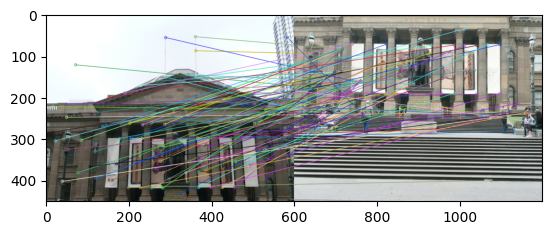

In [90]:
kp1, kp2, matches = feature_match(img1, img2, corner1, corner2, patch_list1, patch_list2)

### 4. RANSAC for outlier rejection and to estimate Robust Homography: [20pts]


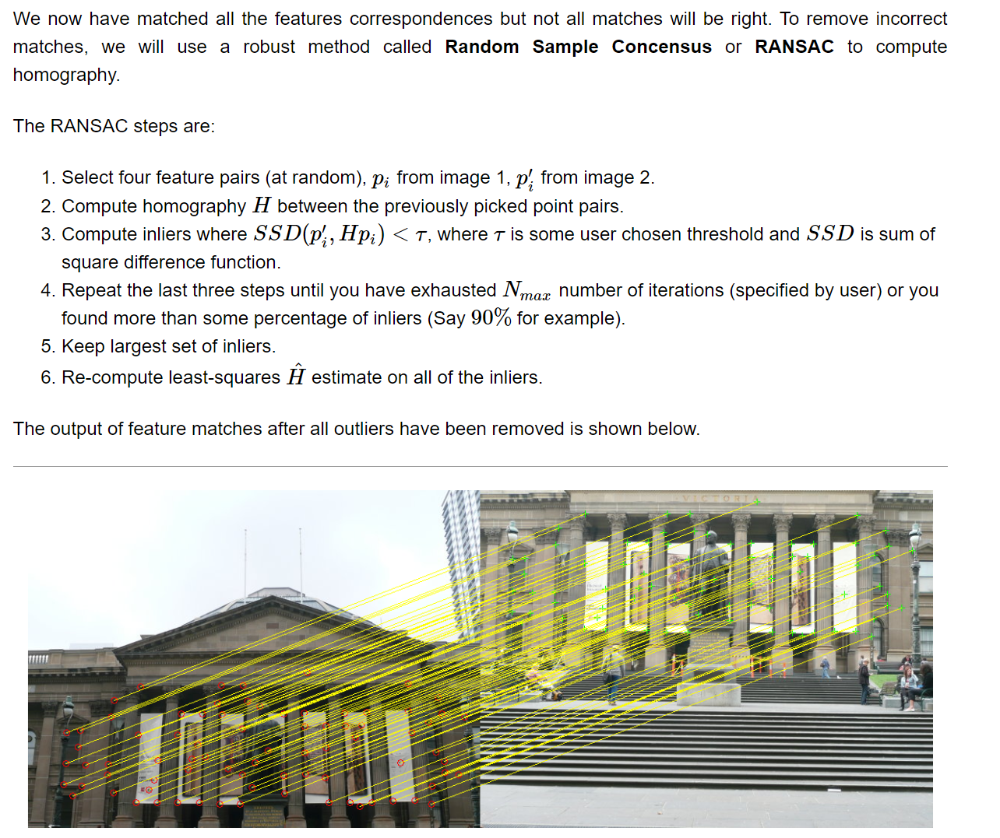

In [91]:
print(matches)

[< cv2.DMatch 0x1753ac150>, < cv2.DMatch 0x1753af770>, < cv2.DMatch 0x1753acd50>, < cv2.DMatch 0x1753ac390>, < cv2.DMatch 0x1753ae4b0>, < cv2.DMatch 0x1753ac610>, < cv2.DMatch 0x1753ae450>, < cv2.DMatch 0x1753ac690>, < cv2.DMatch 0x1753ae350>, < cv2.DMatch 0x1753af810>, < cv2.DMatch 0x1753aeff0>, < cv2.DMatch 0x1753afa10>, < cv2.DMatch 0x1753ace90>, < cv2.DMatch 0x1753ad2d0>, < cv2.DMatch 0x1753ad970>, < cv2.DMatch 0x1753aef10>, < cv2.DMatch 0x178ea5990>, < cv2.DMatch 0x1753ad3b0>, < cv2.DMatch 0x1753ae290>, < cv2.DMatch 0x1753adf90>, < cv2.DMatch 0x1753ac090>, < cv2.DMatch 0x1753ad910>, < cv2.DMatch 0x1753adab0>, < cv2.DMatch 0x1753afa30>, < cv2.DMatch 0x1753aced0>, < cv2.DMatch 0x1753ad8b0>, < cv2.DMatch 0x1753af1d0>, < cv2.DMatch 0x1753af330>, < cv2.DMatch 0x1753afcb0>, < cv2.DMatch 0x1753ae2f0>, < cv2.DMatch 0x1753adc70>, < cv2.DMatch 0x1753af130>, < cv2.DMatch 0x1753acd30>, < cv2.DMatch 0x1753ace50>, < cv2.DMatch 0x178ea4c70>, < cv2.DMatch 0x1753ac890>, < cv2.DMatch 0x1753afbf0>, 

In [92]:
# Ransac to filter out the wrong matchings and return homography
# TODO finetune threshold, model BREAKS if not properly tuned
def RANSAC(kp1, kp2, matches, img1, img2, inlier_threshold=100, RANSAC_threshold=0.9, max_iter=1000):
    # Breaking components into img1, img2
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches])
    dest_pts = np.float32([kp2[m.trainIdx].pt for m in matches])

    best_H = None
    best_inliers = []
    max_inlier_count = 0

    for _ in range(max_iter):
        # Select four random points
        random_indices = np.random.choice(len(matches), size=4, replace=False)
        src = src_pts[random_indices]    
        dest = dest_pts[random_indices]    
        
        # Compute homography transformation
        H = cv2.getPerspectiveTransform(src, dest)

        # Check inliers where SSD(p′i, Hpi) < τ, not clear but p'i is img2 I believe

        ## Need to add 3rd cordinate (value 1) to make homography work
        src_pts_homogeneous = np.column_stack([src_pts, np.ones(len(src_pts))])
        
        transformed_pts = (H @ src_pts_homogeneous.T).T

        ## Undo transformation (Remove 3rd coordinate)
        transformed_pts = transformed_pts[:, :2] / transformed_pts[:, 2:]

        # Test performance of current homography
        ssd = np.sum(np.square(dest_pts-transformed_pts), axis=1)

        inlier_mask = ssd < inlier_threshold
        inlier_count = np.sum(inlier_mask)

        # Keep largest inlier set
        if inlier_count > max_inlier_count:
            max_inlier_count = inlier_count
            best_H = H.copy()
            best_inliers = np.where(inlier_mask)[0]

        if inlier_count / len(matches) >= RANSAC_threshold:
            break

    # Recompute homograhpy
    refined_src = src_pts[best_inliers]
    refined_dest = dest_pts[best_inliers]
    final_H = cv2.getPerspectiveTransform(refined_src[:4], refined_dest[:4]) 

    # Get inlier matches for visualization
    inlier_matches = [matches[i] for i in best_inliers]

    # Visualization
    img_matches = cv2.drawMatches(
        img1, kp1,
        img2, kp2,
        inlier_matches,
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    plt.imshow(img_matches)
    return final_H, inlier_matches

/var/folders/b6/y5slk9j10jl5j1f7wtg0wb380000gn/T/ipykernel_4882/3649964923.py:29: RuntimeWarning: divide by zero encountered in divide
  transformed_pts = transformed_pts[:, :2] / transformed_pts[:, 2:]
/var/folders/b6/y5slk9j10jl5j1f7wtg0wb380000gn/T/ipykernel_4882/3649964923.py:29: RuntimeWarning: invalid value encountered in divide
  transformed_pts = transformed_pts[:, :2] / transformed_pts[:, 2:]


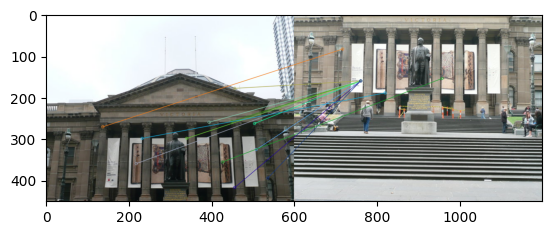

In [100]:
# Show you result here
final_H, inlier_matches = RANSAC(kp1, kp2, matches, img1, img2)

# print(final_H)
# print(inlier_matches)

### 5. Image Warping (and Blending): [25pts]

Panorama can be produced by overlaying the pairwise aligned images to create the final output image. The output panorama stitched from two images shown in the figure below.

When blending these images, there are inconsistency between pixels from different input images due to different exposure/white balance settings or photometric distortions or vignetting. This can be resolved by [Poisson blending](http://www.irisa.fr/vista/Papers/2003_siggraph_perez.pdf). You can use third party code only for the seamless panorama stitching.

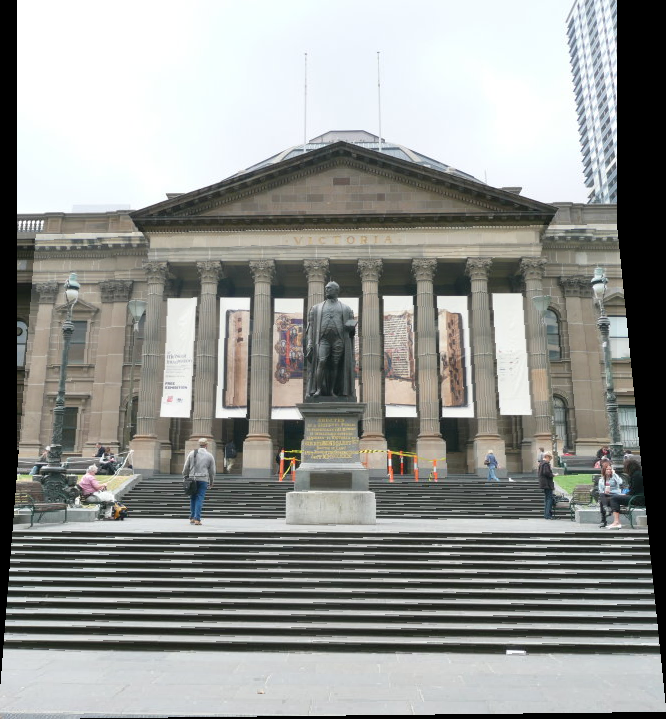

In [62]:
# Warp and Blend two images together based on Homography returned in RANSAC
def warp_and_blend(img1, img2, H):
  return None

In [63]:
# Show you result here

### 6. Putting Everything Together (Stitching more than 2 images)

In [64]:
# Take in a list of images and stitch them together!
def pano_imgs(img_list):
  return None

In [65]:
# Show you result here

## Report
You will be graded primarily based on your report.
A demonstration of understanding of the concepts involved in the project are required show the output produced by your code.

Include visualizations of the output of each stage in your pipeline (as shown in the system diagram on page 2), and a description of what you did for each step. Assume that we’re familiar with the project, so you don’t need to spend time repeating what’s already in the course notes. Instead, focus on any interesting problems you encountered and/or solutions you implemented.

Be sure to include the output panoramas for **all three image sets (from the trainingsets)**. Because you have limited time in which to access the “test set” images, we won’t expect in-depth analysis of your results for them.

As usual, your report must be full English sentences, **not** commented code. There is a word limit of 1500 words and no minimum length requirement.

 **TEST SET will be available 4 days before deadline: TBD on Piazza**

## ***add your report here***


# Allowed Functions

For cv2 advanced functions, only these are allowed:
1. For feature detection: **cv2.cornerHarris**, **cv2.cornerHarris**
2. For drawing matches: **cv2.drawMatches**
3. For estimate homograhy and warping: **cv2.getPerspectiveTransform**, **cv2.warpPerspective**

# Submission Guidelines

**If your submission does not comply with the following guidelines, you’ll be given ZERO credit.**

Your submission on ELMS(Canvas) must be a pdf file, following the naming convention **YourDirectoryID_proj2.pdf**. For example, xyz123_proj2.pdf.

**All your results and report should be included in this notebook. After you finished all, please export the notebook as a pdf file and submit it to ELMS(Canvas).**

# Collaboration Policy
You are encouraged to discuss the ideas with your peers. However, the code should be your own, and should be the result of you exercising your own understanding of it. If you reference anyone else’s code in writing your project, you must properly cite it in your code (in comments) and your writeup. For the full honor code refer to the CMSC426 Fall 2023 website.